<img src="https://github.com/astro-datalab/notebooks-latest/blob/master/06_EPO/e-TeenAstronomyCafe/08_Breaking_the_Solar_System/Figures/logo154.svg?raw=1" alt="to Go logo" width="100" align="right"/>
<br>
<br>
<font size='6'><u><b>Destruyendo el Sistema Solar</b></u></font>
<br><br>
<font size='4'><b>Otras formas en que las simulaciones nos ayudan a comprender el Universo</b></font>
<br>

En esta actividad, vamos a ejecutar simulaciones de sistemas planetarios para comprender qué tan estable es el Sistema Solar. ¿Se vería igual el Sistema Solar si todo fuera 10 veces más masivo? ¿Qué pasaría si los planetas estuvieran más juntos? ¿o más alejados?

¡Esperamos que, al final de la actividad de hoy, tengas las respuestas!

___

# Tabla de Contenidos

* [Cómo usar esta Guía](#How-to-Use-This-Notebook)
* [Configuración Previa a la Actividad](#Pre-Activity-Setup)
* [Actividad 1: Simulando con un solo Planeta](#Activity-1:-Simulate-a-Single-Planet)
    * [Parte 1.1: Crear una simulación de Rebound](#Part-1.1:-Create-a-Rebound-simulation-Part)
    * [Parte 1.2: Agregando una estrella central para que nuestros planetas orbiten](#Part-1.2:-Add-a-central-star-for-our-planets-to-orbit)
    * [Parte 1.3: Agregando planetas](#Part-1.3:-Add-planets)
    * [Parte 1.4: Ejecuta la simulación](#Part-1.4:-Run-the-simulation)
* [Actividad 2: Simular un exoplaneta de la clase Júpiter Caliente](#Activity-2:-Simulate-a-Hot-Jupiter-Exoplanet)
* [Actividad 3: Simula el Sistema Solar](#Activity-3:-Simulate-the-Solar-System)
* [Actividad 4: Destruyendo el Sistema Solar](#Activity-4:-Break-the-Solar-System)     
___

# Cómo usar esta Guía

La página web en la que te encuentras es en realidad una aplicación llamada Jupyter Notebook, muy parecida a las de tu teléfono. Esta aplicación contiene celdas.

Una celda de *entrada/input* parece un cuadro gris claro con un `In [ ]` a su izquierda. Cada una de las celdas de entrada contiene códigos: instrucciones para hacer que el computador haga algo.

Para activar o seleccionar una celda, haz clic en cualquier lugar dentro de ella.

\\
<div class='alert alert-info'>
    <font size='3'><b>Selecciona la celda de abajo y lee su contenido.</b></font>
</div>

In [ ]:
# El texto que sigue a un "#" es un comentario.
# Los comentarios no afectan su código de ninguna manera.
# Lea siempre los comentarios en la parte superior de cada celda con la que interactúe.
# Los comentarios se utilizarán para describir lo que realmente está haciendo el código de la celda.

Para ejecutar una celda seleccionada, haz clic en el pequeño botón de reproducción o presiona `[Shift + Enter]` en tu teclado.

\\
<div class='alert alert-info'>
    <font size='3'><b>Selecciona la celda de abajo y lee su contenido. Luego, ejecuta la celda.</b></font>
        <br> Si aparece una advertencia, simplemente haz clic en <em>"Ejecutar de todos modos"</em>, este código es seguro 😉
        <br> Además, si deseas guardar tu progreso, haz clic en el botón <em>"Guardar una copia en Drive"</em> en la parte superior.
      </div>


In [ ]:
# El texto que NO está antecedido por un "#" se considera código.
# Las líneas de código son instrucciones dadas a tu computador.
# La línea de código de abajo es una instrucción de "impresión" (print), que literalmente imprime el texto entre comillas.

print("¡Felicitaciones! ¡Has ejecutado con éxito tu primera celda!")


¡Felicitaciones! ¡Has ejecutado con éxito tu primera celda!


Ejecutar una celda crea una *salida/output* directamente debajo de ella. Una salida puede ser un texto, un gráfico, un control deslizante interactivo, ¡o incluso nada en absoluto! Cuando has ejecutado una celda, aparece un número entre corchetes, por ejemplo [1] al lado izquierdo de la celda.

Puedes obtener más información sobre cómo funcionan los Jupyter Notebooks en https://try.jupyter.org/ (página en inglés)
___


___
# Configuración Previa a la Actividad

#### <font color=blue>Antes de comenzar a simular </font>

Necesitamos cargar el software que usaremos en esta actividad. Estamos usando un paquete de simulación muy bueno llamado `Rebound` que hace la mayor parte del trabajo duro por nosotros. ¡La primera regla para escribir un nuevo software es que debe tener un nombre atractivo!

Ingresa al menú "Runtime" (entorno de ejecución) y selecciona la opción "Run all" (ejecutar todo). Ejecutar todo ayuda a garantizar que no se omitió ninguna celda y que todas las bibliotecas fueron importadas.

Para que cualquiera de las actividades funcione correctamente, debes importar las bibliotecas necesarias para el funcionamiento del código de esta guía. Estos ya deberían haberse cargado cuando ejecutaste todas las celdas.

A medida que trabajas en Python Notebook, también puedes volver a ejecutar cada celda individualmente.

<div class='alert alert-info'>
    <font size='3'><b>Selecciona y ejecuta la celda a continuación.</b></font>
</div>



In [ ]:
#Si estás ejecutando esto en Colab...

!pip install rebound &> /dev/null
print("Has instalado con éxito: Rebound")

Has instalado con éxito: Rebound


In [ ]:
# Ahora creamos una variable con el enlace/link a nuestro repositorio
repoURL = 'https://raw.githubusercontent.com/astro-datalab/notebooks-latest/master/06_EPO/e-TeenAstronomyCafe/'

import requests

url = repoURL+'08_Breaking_the_Solar_System/Files/tools.ipynb'
r = requests.get(url, allow_redirects=True, stream=True)
open('tools.ipynb', 'wb').write(r.content)

print("Has descargado con éxito las herramientas adicionales necesarias para esta actividad.")

Has descargado con éxito las herramientas adicionales necesarias para esta actividad.


In [ ]:
# Cargando el programa
# NO CAMBIES NADA EN ESTA CELDA

#Paquete de simulación
import rebound

# Paquetes de matemáticas
from numpy import *

# Paquetes de gráfica y configuraciones
import matplotlib.pyplot as plt
plt.rcParams['animation.html']='jshtml'
plt.rcParams['animation.embed_limit']=1024
%matplotlib inline

# Herramientas tras "bambalinas" para simplificar el código
%run tools.ipynb

# Corrección temporal de algunas advertencias benignas que aparecen al ejecutar esto en Binder
import warnings
warnings.filterwarnings("ignore")

print('¡Listo! Has importado correctamente las bibliotecas.')

¡Listo! Has importado correctamente las bibliotecas.


<div class='alert alert-info'>
    <h3 class='alert-heading'>Recordatorio(s) Útil(es)</h3>
    <ul>
        <li>La guía del estudiante que acompaña a esta actividad de Python Notebook se puede encontrar en este <a href="https://rsmullen.github.io/files/BTSS_companion_worksheet.pdf">enlace</a>.</li>
    </ul>
</div>


___
# Actividad 1: Simulando con un solo planeta

El tipo de simulaciones que estamos ejecutando aquí se denominan **simulaciones de N-cuerpos** porque utilizan la fuerza gravitacional entre cuerpos para predecir las posiciones de estos en el futuro. Recuerda que la fuerza gravitacional entre dos cuerpos se define como


$$
 F = \frac{-Gm_1m_2}{r^2}
$$

donde $G$ es la constante gravitacional, $m_1$ es la masa de un cuerpo, $m_2$ es la masa del otro cuerpo y $r$ es la distancia entre los dos cuerpos. Si los objetos están más cerca, o si uno de los cuerpos es masivo, la fuerza será mayor, lo que provocará fuerzas más grandes entre los cuerpos que pueden hacer que sucedan cosas muy extrañas.


Existen cuatro pasos para ejecutar una simulación de un sistema planetario. Esta sección te guiará para entender cada pieza del rompecabezas.

<font color=red><b>Ejecuta cada una de las celdas de código de abajo cuando comprendas lo que hace.</b></font>

## Parte 1.1: Crear una simulación de Rebound

Agregaremos todas nuestras estrellas y planetas a esta simulación de cuerpos.

In [ ]:
mysim = initialize_simulation() # Crea una simulación llamada 'mysim'

## Parte 1.2: Agregar una estrella central para que nuestros planetas orbiten

Debemos especificar la _masa_ y el _nombre_ de la estrella. La estrella siempre debe ser el primer objeto agregado a la simulación.

La masa de la estrella debe tener unidades de **masas solares** (unidades donde la masa del Sol equivale a 1) y puede tener cualquier nombre que desees (siempre que esté entre comillas `" `o` '`)


In [ ]:
add_star(mysim,name='Estrella',mass=1.0) # Agrega una estrella a mysim, con masa en unidades de masas solares

## Parte 1.3: Agregar planetas

Los planetas deben tener *masa*, un *nombre* y *semieje mayor*. Cada planeta requiere su propia órbita. </font>

Los planetas también pueden tener *excentricidad*, *inclinación*, *argumento del perihelio*, *longitud del nodo ascendente* y *anomalía verdadera*, pero estos valores predeterminados quedarán en 0 si no se especifican. Recuerda que estas definiciones se describen en la guía del estudiante. Los valores $ i $, $ \omega $, $ \Omega $ y $ f $ tienen unidades de grados ($ 0-360^\ circ $). Puedes especificar la cantidad de parámetros que tú encuentres necesaria.

La masa del planeta debe estar en unidades de **masas de Júpiter** (unidades donde la masa de Júpiter equivale a 1), y el semieje mayor debe tener unidades en **unidades astronómicas (ua)** (unidad donde la distancia entre el Sol y la Tierra equivale 1). No olvidar que el nombre debe ir entre comillas.

Como nota aparte: la masa de Júpiter es ${\approx} 1/1000$ veces la del Sol. La masa de la Tierra es $ {\approx} \frac{1}{300} $ veces la de Júpiter o $\frac{1}{300{,}000} $ veces la masa del Sol.


In [ ]:
add_planet(mysim,name='Planeta',mass=1,a=1) # Agrega un planeta a mysim con masa en masas de Júpiter y en AU

## Parte 1.4: Ejecutar la simulación

Ejecutaremos la simulación durante un período de tiempo que se especifica con la variable *end\_time*. Esta parte del código nos entrega como resultado una película de la(s) órbita(s) de los planeta(s) que hemos agregado a la simulación. La podemos ver escribiendo el nombre de la película, en este caso "movie". También entrega tres gráficos con las variaciones (si es que hay) del semieje mayor, la distancia a la estrella y la excentricidad en función del tiempo </font>

El tiempo en la simulación se mide en **años**. <Font color = red> ¡Este paso puede demorar unos segundos! El código se está ejecutando si ves que los [ ] están cargando </font>


Progress:   0%|          | 0/100 [00:00<?, ?it/s]

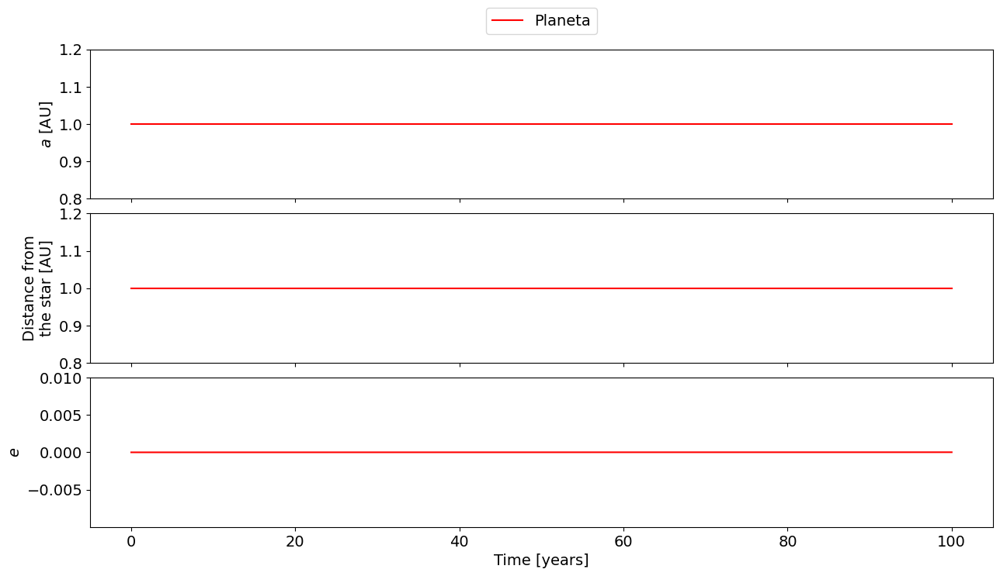

In [ ]:
movie = run_simulation(mysim,end_time=100) # Ejecuta mysim durante 10 años
movie # muestra la película

<font color=green>Hay algunas cosas que debes tener en cuenta y que pueden ser útiles en los próximos pasos.</font>

Primero, mientras se ejecutaba la simulación, deberías haber visto una barra de progreso con algunos números a un lado. La barra de progreso es para que sepas el estado de tu simulación. En simulaciones muy cortas, la película puede ejecutarse tan rápido que no alcanzarás a ver la barra de progreso. El significado de los números se muestra en la siguiente imagen. En particular, los números "%Done" (Listo%) y "Time Remaining" (Tiempo restante) son bastante útiles.


<img src="https://github.com/astro-datalab/notebooks-latest/blob/master/06_EPO/e-TeenAstronomyCafe/08_Breaking_the_Solar_System/Figures/progress.jpeg?raw=1" style="width: 600px;">

En segundo lugar, tiene una película para reproducir que muestra una vista "desde arriba hacia abajo" de nuestro sistema planetario. Los controles de la película se muestran en la siguiente imagen.


<img src="https://github.com/astro-datalab/notebooks-latest/blob/master/06_EPO/e-TeenAstronomyCafe/08_Breaking_the_Solar_System/Figures/movie.jpeg?raw=1" style="width: 500px;">

A veces, las películas pueden parecer retroceder o permanecer quietas. Esto se llama ["Efecto de rueda de carro"](https://es.wikipedia.org/wiki/Efecto_de_rueda_de_carro). Si el planeta parece quedarse quieto, los [fotogramas](https://es.wikipedia.org/wiki/Fotograma) de la película se emiten una vez cada vez que el planeta gira alrededor de la estrella un número entero de veces. Si el planeta parece moverse al revés, los fotogramas se emiten cuando el planeta gira más de una vez pero menos de dos veces (o un múltiplo entero) entre fotogramas.


<font color=green>**Antes de seguir adelante**</font>, ten presente que podemos poner todo el código en una celda para simplificar las cosas. A continuación se muestra un ejemplo. <Font color = red> _No_ necesitas ejecutar este código.</font>

Progress:   0%|          | 0/100 [00:00<?, ?it/s]

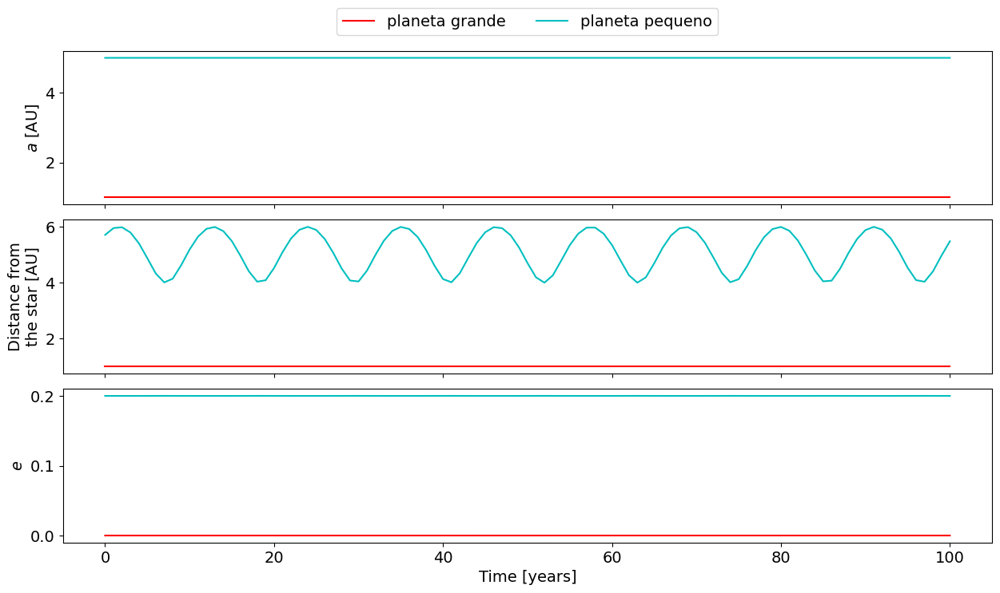

In [ ]:
# Crea una simulación
mysim = initialize_simulation()

# Agrega una estrella
add_star(mysim, name='Sol', mass=1.0)

# Agrega algunos planetas
add_planet(mysim, name='planeta grande', mass=1, a=1) # un Jupiter a 1 AU
add_planet(mysim, name='planeta pequeno', mass=1/300, a=5, e=0.2, i=10, omega=180, Omega=90, f=143) # una Tierra excéntrica a 5 AU

# Ejecuta la simulación y muestra la película
movie = run_simulation(mysim,end_time=100)
movie

___
# Actividad 2: Simular un exoplaneta de la clase Júpiter caliente

En 1995 fue la primera vez que se observó un planeta fuera de nuestro Sistema Solar, llamado 51 Pegasi b. Fue descubierto por los astrónomos Michel Mayor y Didier Queloz, los cuales en 2019 recibieron el Premio Nobel en Física.  

51 Pegasi b, y la mayoría de los otros exoplanetas (planetas fuera de nuestro propio Sistema Solar) descubiertos antes de 2012 son una clase de planetas llamados **Júpiteres calientes**. Estos son planetas _masivos_ que orbitan _muy cerca_ de su estrella anfitriona y suelen ser _excéntricos_.

 <font color=green>Creamos una lista de Júpiter calientes en [este enlace](https://rsmullen.github.io/files/hot_Jupiters.html).</font>


<font color=red>**Siguiendo la guía del estudiante, ¡simula tu primer planeta!** </font> <br>

Selecciona tu Júpiter caliente favorito de la lista de arriba. Crea una nueva simulación y agrega la estrella y el planeta. Ejecuta la simulación por 5 años. Asume que todos los parámetros orbitales que no figuran en la tabla son 0.


<sub>¡Copiar y pegar está totalmente aceptado, siempre y cuando verifiques todos tus números! 🙃 </sub>

In [ ]:
# Agrega tu simulación abajo

<div class='alert alert-danger'>
    <h3 class='alert-heading'>Antes de continuar:</h3>
    <ul>
        <li>Esperemos a que todos lleguen hasta aquí antes de seguir con los siguientes pasos.</li>
        <li> ¡Asegúrate de que tu guía del estudiante esté completa! Si terminaste antes, comparte tus resultados.</li>
    </ul>
</div>

____
# Actividad 3: Simula el Sistema Solar


Antes de modificar y destruir el Sistema Solar, primero asegurémonos de que podamos hacerlo funcionar en su configuración actual.

<font color=red>**Agrega el Sol y los planetas gigantes a la siguiente simulación y ejecútala por 100 años.** </font><br>
Los elementos orbitales del Sistema Solar están en la guía del estudiante. La órbita de Neptuno dura 164 años. En tu simulación, ¿realiza al menos una órbita completa alrededor del Sol?, ¿cómo esperas que cambien las órbitas en escalas de tiempo largas, considerando que el Sistema Solar existe desde hace 4.500 millones de años?


Progress:   0%|          | 0/1 [00:00<?, ?it/s]

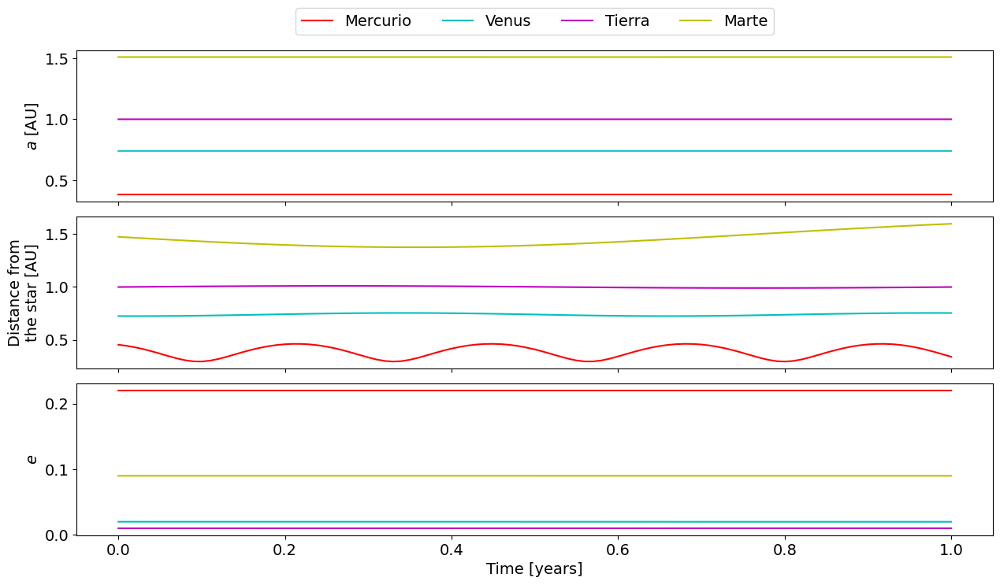

In [ ]:
# Crea una simulación
mysim = initialize_simulation()

# Agrega el Sol aquí



# Los planetas interiores
add_planet(mysim, name='Mercurio', mass=0.00017, a=0.38, e=0.22, i=7.1, omega=30,  Omega=48,  f=201)
add_planet(mysim, name='Venus',    mass=0.0026,  a=0.74, e=0.02, i=3.4, omega=91,  Omega=7,   f=347)
add_planet(mysim, name='Tierra',   mass=0.0031,  a=1.00, e=0.01, i=0.0, omega=335, Omega=133, f=86)
add_planet(mysim, name='Marte',    mass=0.00034, a=1.51, e=0.09, i=1.9, omega=292, Omega=49,  f=281)

# Agrega los planetas gigantes aquí


# Plutón-Caronte, solo por diversión. :)
#add_planet(mysim, name='Pluton-Caronte', mass=0.000007, a=39.5, e=0.25, i=17.1, omega=114, Omega=110, f=69)

# Ejecuta la simulación
movie = run_simulation(mysim, end_time=1)
movie


Puede que hayas notado que esta simulación tomó mucho tiempo en ejecutarse en comparación con las simulaciones que ejecutamos anteriormente. Existen tres cosas importantes que afectan el tiempo de ejecución:



1. El tiempo de duración de la simulación (obviamente).
2. El número de cuerpos en la simulación (en este caso, planetas). Cada paso requiere $2^N$ cálculos, donde *N* es la cantidad de planetas, por lo que para un sistema de dos planetas, se requieren cuatro cálculos y para un sistema de ocho planetas, como el Sistema Solar, serían 256 cálculos. Entonces, menos planetas significa una simulación más rápida.
3. La distancia del planeta más cercano a la estrella. Como estamos aproximando las órbitas entre iteraciones de tiempo, tenemos que hacer iteraciones más pequeñas para obtener una buena aproximación si hay un planeta muy cerca a la estrella. Por ejemplo, si añadimos a Mercurio en nuestra simulación, un año requiere 83 iteraciones en la simulación, pero si Júpiter fuese el planeta más cercano al Sol, un año requiere 2 iteraciones en la simulación. Un planeta interior más distante significa una simulación más rápida.

___
# Actividad 4: Destruyendo el Sistema Solar

¿Qué tan sensible es la estabilidad del Sistema Solar? ¡Ahora lo  averiguarás! <br>
Antes de comenzar la actividad, comienza con la guía del estudiante que te ayudará a entender lo que deseas investigar.


**¡Ejecuta algunas simulaciones para descubrir la modificación más pequeña que necesitas para destruir el Sistema Solar según el criterio que definiste en la guía del estudiante!**

* Cada simulación que pruebes debe ir en su propia celda. En la parte superior de la celda, escribe un comentario para recordar lo que estás probando. Recuerda que los comentarios comienzan con `#`.
*Ejecuta cada simulación hasta un tiempo final de 10 millones de años. Esto se puede escribir en su código como `end_time=10E6` (la E mayúscula es importante; en lenguaje de código, esto se traduce como $10 \times10^6$).
*¡Asegúrate de ir completando tu guía del estudiante a medida que vas avanzando!

<br>
<img src="https://github.com/astro-datalab/notebooks-latest/blob/master/06_EPO/e-TeenAstronomyCafe/08_Breaking_the_Solar_System/Figures/savage.jpeg?raw=1" width=300  />

In [ ]:
# Parámetros a probar:

# Agrega tu simulación abajo


In [ ]:
# Parámetros a probar:

# Agrega tu simulación abajo


In [ ]:
# Parámetros a probar:

# Agrega tu simulación abajo


In [ ]:
# Parámetros a probar:

# Agrega tu simulación abajo


In [ ]:
# Parámetros a probar:

# Agrega tu simulación abajo


¿Te gustó la película que creaste con tu simulación? Puedes guardarla para llevarla a tu casa colocando el siguiente comando al final de la celda que creó la película (puedes cambiar `'mymovie'` por el nombre que desees). Luego estará en la carpeta de almacenamiento de la sesión de Colab (panel izquierdo) para que lo descargues a tu computador.


In [ ]:
movie.save('mymovie.mpeg')


_**Creado por Rachel Smullen y Christine O'Donnell 2020.**_

_**Traducido por Fernanda Urrutia y Carolina Vargas 2023.**_